<a href="https://colab.research.google.com/github/giuliabet/multi-class-classification/blob/main/complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# LIBRARIES
# Standrd libraries
import numpy as np
import pandas as pd
import random

# Dataset, high level feature
import torch
from torchvision.datasets import CIFAR100
from torchvision import transforms

# Plot
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

import warnings
import joblib

# Classification and metrics
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report

In [ ]:
# CPU inizialization
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
# Show warning messages
def warn(*args, **kwargs):
    pass

warnings.warn = warn

In [ ]:
# SET UP
# Data augmentation
train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2470, 0.2435, 0.2616])
])
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465], std=[0.2470, 0.2435, 0.2616])
])

# Spitting phase
train_dataset = CIFAR100(
    root='./data',
    train=True,
    download=True,
    transform=train_transforms
)

test_dataset = CIFAR100(
    root='./data',
    train=False,
    download=True,
    transform=test_transforms
)

# Animal classes
animal_classes = [
    'bear', 'leopard', 'lion', 'tiger', 'wolf',
    'camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo',
    'fox', 'porcupine', 'possum', 'raccoon', 'skunk',
    'hamster', 'mouse', 'rabbit', 'shrew', 'squirrel'
]

# Mapping
all_classes = train_dataset.classes
animal_class_indices = [all_classes.index(cls) for cls in animal_classes]

X_train = np.array(train_dataset.data)
y_train = np.array(train_dataset.targets)

X_test = np.array(test_dataset.data)
y_test = np.array(test_dataset.targets)

# Filter
animal_train_mask = np.isin(y_train, animal_class_indices)
animal_test_mask = np.isin(y_test, animal_class_indices)

X_train = X_train[animal_train_mask]
y_train = y_train[animal_train_mask]

X_test = X_test[animal_test_mask]
y_test = y_test[animal_test_mask]

# Normalization and reshaping
X_train = X_train / 255.0
X_train_flat = X_train.reshape(X_train.shape[0], -1)

X_test = X_test / 255.0
X_test_flat = X_test.reshape(X_test.shape[0], -1)

print(f"Train set animali: {X_train.shape[0]} immagini")
print(f"Test set animali: {X_test.shape[0]} immagini")

100.0%


Train set animali: 10000 immagini
Test set animali: 2000 immagini


10 classes randomly selected:
- lion
- rabbit
- wolf
- camel
- shrew
- chimpanzee
- possum
- cattle
- fox
- raccoon


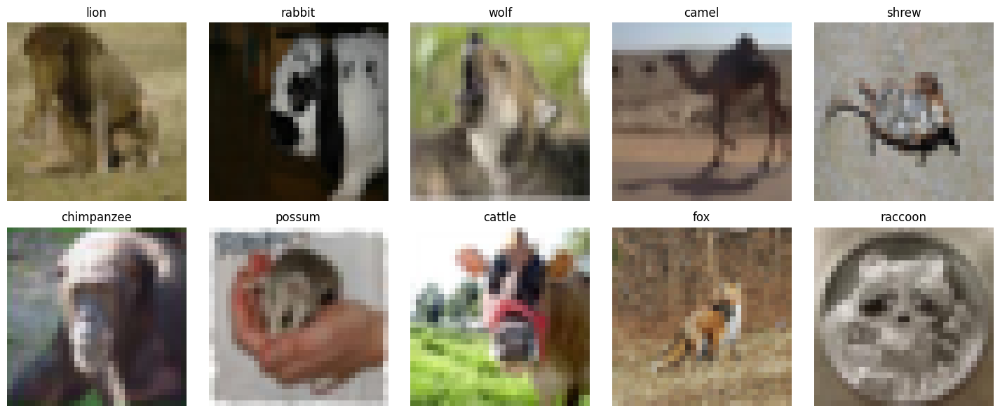

In [ ]:
# DATA VISUALIZATION
# Secelct 10 random classes from the filtered dataset
available_animal_class_indices = np.unique(y_train)
random_animal_class_indices = np.random.choice(available_animal_class_indices, size=10, replace=False)

# Mapping index - names
random_animal_class_names = [all_classes[idx] for idx in random_animal_class_indices]

print("10 classes randomly selected:")
for name in random_animal_class_names:
    print("-", name)

# Show the first image for each class
plt.figure(figsize=(15, 6))
for i, class_idx in enumerate(random_animal_class_indices):
    idx = np.where(y_train == class_idx)[0][0]
    img = X_train[idx]

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(all_classes[class_idx])
    plt.axis('off')


plt.subplots_adjust(hspace=1)
plt.tight_layout()
plt.savefig("dataset.svg", format="svg", dpi=500, bbox_inches="tight", backend="svg")
plt.show()

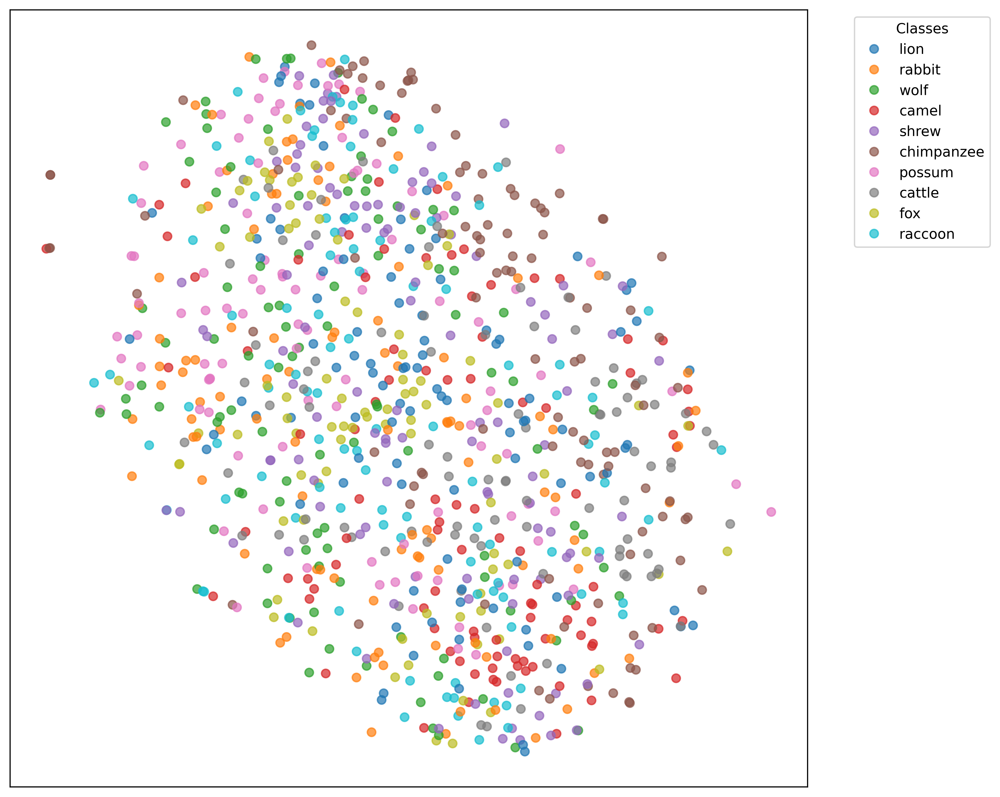

In [ ]:
# Filter the dataset: only selected classes
mask_10_classes = np.isin(y_train, random_animal_class_indices)
X_subset = X_train_flat[mask_10_classes]
y_subset = y_train[mask_10_classes]

# Fix number of samples to be scattered
num_samples = 1000
subset_indices = np.random.choice(X_subset.shape[0], num_samples, replace=False)
X_sample = X_subset[subset_indices]
y_sample = y_subset[subset_indices]

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_sample)

label_map = {global_idx: i for i, global_idx in enumerate(random_animal_class_indices)}
y_mapped = np.array([label_map[label] for label in y_sample])

plt.figure(figsize=(10, 8), dpi=500)
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_mapped, cmap='tab10', alpha=0.7)

plt.xticks([])
plt.yticks([])

handles, _ = scatter.legend_elements()
plt.legend(handles, random_animal_class_names, title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig("tsne_10_classes.svg", format="svg", dpi=500, bbox_inches="tight", backend="svg")
plt.show()

In [ ]:
# FUNCTIONS DEFINITION
# Save model
def save_model(model, model_name):
    joblib.dump(model, f'{model_name}.pkl')

    print("Model saved!")

# Load model
def load_model(model_name):
    model = joblib.load(f'{model_name}.pkl')

    return model

# Test trained model
def test(model, images, labels, model_name):
    pred = model.predict(images)

    acc = accuracy_score(labels, pred)
    f1 = f1_score(labels, pred, average='macro')
    precision = precision_score(labels, pred, average='macro')
    recall = recall_score(labels, pred, average='macro')

    print(f'Model: {model_name} | Test Accuracy: {acc*100:.2f}% | Test F1 score: {f1*100:.2f}% | Precision: {precision*100:.2f}% | Recall: {recall*100:.2f}%')

    return acc, f1, precision, recall

# Train model
def train(pipeline, params, x, y, n_folds=5):
    k_fold = KFold(n_splits=n_folds)

    model = GridSearchCV(
        pipeline,
        params,
        cv=k_fold,
        scoring='accuracy',
        refit='accuracy',
        verbose=2)
    model.fit(x, y)

    display_best_parameters(model)

    return model

# Comparison between models
def create_comparison(models, names, x_test, y_test):
    results = []

    for model, name in zip(models, names):
        display_best_parameters(model, name)
        acc, f1, precision, recall = test(model, x_test, y_test, name)
        results.append([name, 'Accuracy', acc])
        results.append([name, 'F1 Score', f1])
        results.append([name, 'Precision', precision])
        results.append([name, 'Recall', recall])

    results = pd.DataFrame(results, columns=['Model', 'Metric', 'Score'])

    plt.figure(figsize=(20, 10))
    sns.barplot(x='Model', y='Score', hue='Metric', data=results)
    plt.title('Test Accuracy, Precision, Recall, F1-Score ')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return results

# Best parameter visualization
def display_best_parameters(model, name='Model'):
    best_params = {
        key.replace("onevsoneclassifier__estimator__", "")
        .replace("onevsrestclassifier__estimator__", ""): value
        for key, value in model.best_params_.items()}

    best_score = f"{model.best_score_ * 100:.2f}%"

    print(f"> Model: {name}")
    print(f"\t> Best parameters: {best_params}")
    print(f'\t> Best training score: {best_score}\n')

# Confusion matrix
def show_confusion_matrix(model, images, labels, model_name):
    pred = model.predict(images)
    cm = confusion_matrix(labels, pred)

    plt.figure(figsize=(10, 10), dpi=500)

    sns.heatmap(
        cm,
        annot=True,
        fmt='g',
        cmap='Blues',
        xticklabels=animal_classes,
        yticklabels=animal_classes,
        annot_kws={"size": 12})

    plt.xlabel('Predicted class', fontsize=14)
    plt.ylabel('True class', fontsize=14)
    plt.title('Confusion Matrix', fontsize=16)

    plt.tight_layout()
    plt.savefig(
        f"CM_{model_name}.svg",
        format="svg",
        backend = "svg",
        dpi=500)

    plt.show()

In [ ]:
# LOGISTIC REGRESSION

In [ ]:
# TRAINING: one vs rest
lr_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', whiten=True, random_state=42),
    OneVsRestClassifier(LogisticRegression(max_iter=1000, random_state=42))
)

param_grid = {
    'onevsrestclassifier__estimator__C': [0.1, 1, 10, 100],
    'onevsrestclassifier__estimator__penalty': ['l2'],
    'onevsrestclassifier__estimator__solver': ['sag', 'saga']
}

# Training model
model = train(lr_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "lr_ovr_model")

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=sag; total time=  10.6s
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=sag; total time=  10.7s
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=sag; total time=  10.6s
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=sag; total time=  10.3s
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=sag; total time=  10.6s
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__penalty=l2, onevsrestclassifier__estimator__solver=saga; total time=  12.9s
[CV] END 

In [ ]:
# TRAINING: one vs one
lr_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', whiten=True, random_state=42),
    OneVsOneClassifier(LogisticRegression(max_iter=1000, random_state=42))
)

param_grid = {
    'onevsoneclassifier__estimator__C': [0.1, 1, 10, 100],
    'onevsoneclassifier__estimator__penalty': ['l2'],
    'onevsoneclassifier__estimator__solver': ['sag', 'saga']
}

model = train(lr_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "lr_ovo_model")

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=sag; total time=  14.7s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=sag; total time=  15.0s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=sag; total time=  14.8s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=sag; total time=  14.7s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=sag; total time=  14.9s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__penalty=l2, onevsoneclassifier__estimator__solver=saga; total time=  22.4s
[CV] END onevsoneclassifier

              precision    recall  f1-score   support

        bear       0.15      0.15      0.15       100
     leopard       0.29      0.27      0.28       100
        lion       0.25      0.18      0.21       100
       tiger       0.37      0.49      0.42       100
        wolf       0.24      0.23      0.24       100
       camel       0.27      0.28      0.28       100
      cattle       0.35      0.43      0.38       100
  chimpanzee       0.13      0.13      0.13       100
    elephant       0.15      0.10      0.12       100
    kangaroo       0.27      0.35      0.30       100
         fox       0.19      0.15      0.17       100
   porcupine       0.25      0.21      0.23       100
      possum       0.11      0.13      0.12       100
     raccoon       0.14      0.10      0.12       100
       skunk       0.20      0.16      0.18       100
     hamster       0.15      0.15      0.15       100
       mouse       0.25      0.40      0.31       100
      rabbit       0.15    

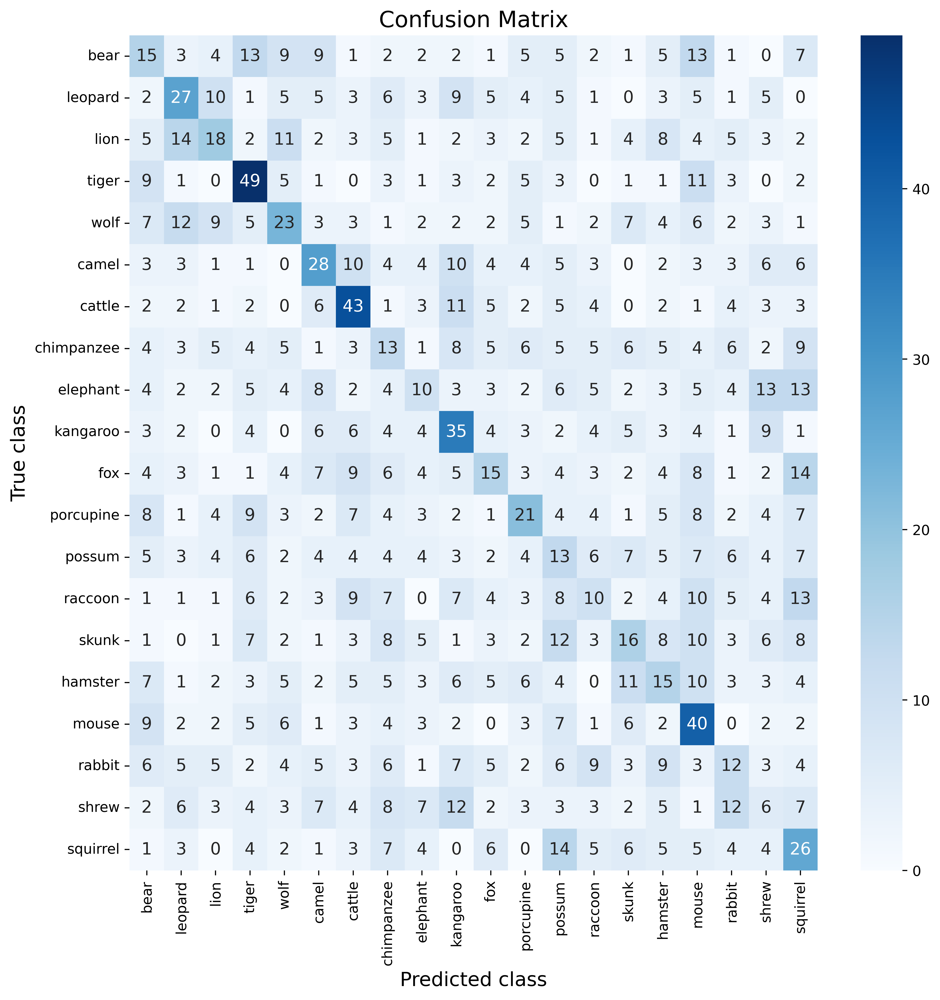

In [ ]:
# TEST: one vs rest
model = load_model("lr_ovr_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "lr_ovr")

              precision    recall  f1-score   support

        bear       0.18      0.19      0.18       100
     leopard       0.21      0.23      0.22       100
        lion       0.16      0.11      0.13       100
       tiger       0.38      0.45      0.41       100
        wolf       0.19      0.18      0.19       100
       camel       0.30      0.30      0.30       100
      cattle       0.34      0.39      0.36       100
  chimpanzee       0.13      0.12      0.12       100
    elephant       0.12      0.09      0.10       100
    kangaroo       0.27      0.34      0.30       100
         fox       0.20      0.16      0.18       100
   porcupine       0.24      0.21      0.23       100
      possum       0.16      0.19      0.17       100
     raccoon       0.15      0.13      0.14       100
       skunk       0.14      0.12      0.13       100
     hamster       0.17      0.17      0.17       100
       mouse       0.26      0.34      0.29       100
      rabbit       0.13    

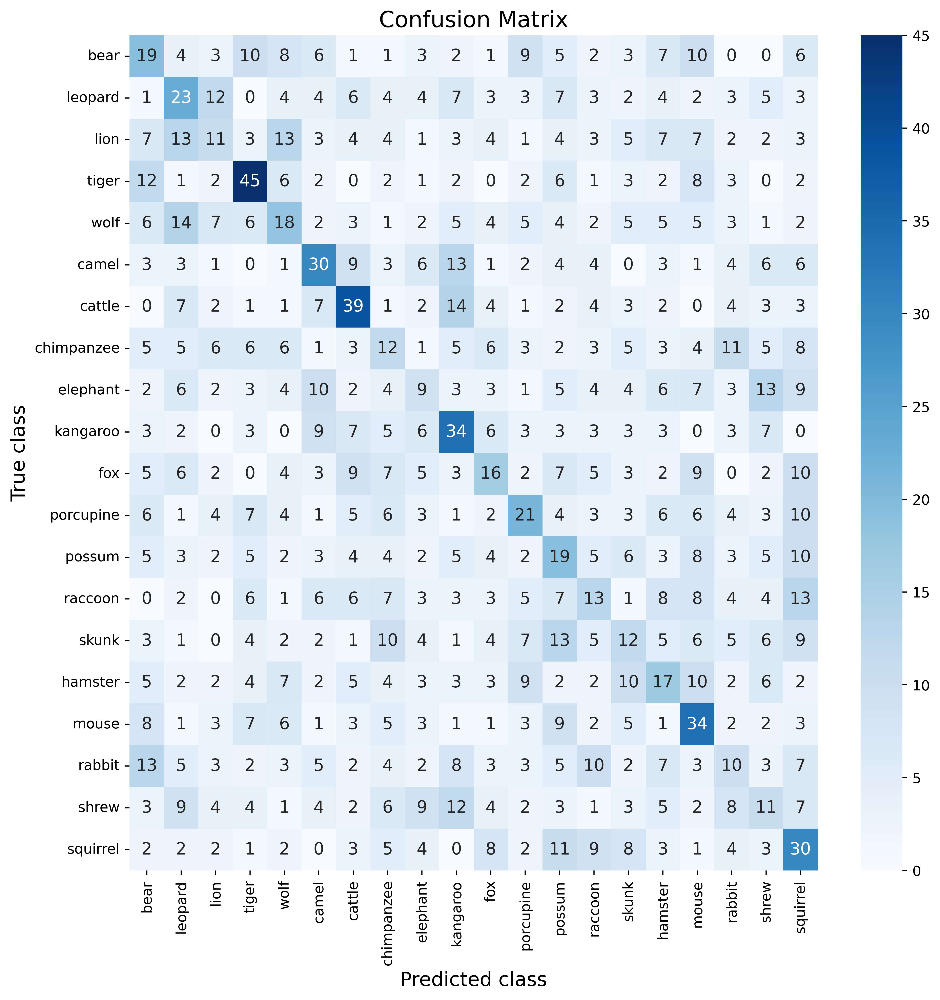

In [ ]:
# TEST: one vs one
model = load_model("lr_ovo_model")
y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))
show_confusion_matrix(model, X_test_flat, y_test, "lr_ovo")

In [ ]:
# SVM

In [ ]:
# TRAINING: one vs rest
svm_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsRestClassifier(SVC(random_state=42, kernel='rbf'))
)

param_grid = {
    'onevsrestclassifier__estimator__C': [0.1, 1, 10, 100],
    'onevsrestclassifier__estimator__gamma': [0.1, 0.01, 'scale', 'auto']
}

# Training model
model = train(svm_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "svm_ovr_model")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.1; total time= 2.0min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.1; total time= 2.1min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.1; total time= 2.1min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.1; total time= 2.0min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.1; total time= 2.1min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.01; total time= 2.0min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.01; total time= 2.0min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsrestclassifier__estimator__gamma=0.01; total time= 2.0min
[CV] END onevsrestclassifier__estimator__C=0.1, onevsres

In [ ]:
# TRAINING: one vs one
svm_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsOneClassifier(SVC(random_state=42, kernel='rbf'))
)

param_grid = {
    'onevsoneclassifier__estimator__C': [0.1, 1, 10, 100],
    'onevsoneclassifier__estimator__gamma': [0.1, 0.01, 'scale', 'auto']
}

# Training model
model = train(svm_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "svm_ovo_model")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.1; total time= 1.1min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.1; total time= 1.1min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.1; total time= 1.0min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.1; total time= 1.0min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.1; total time= 1.0min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.01; total time=  57.6s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.01; total time= 1.1min
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estimator__gamma=0.01; total time=  58.7s
[CV] END onevsoneclassifier__estimator__C=0.1, onevsoneclassifier__estim

              precision    recall  f1-score   support

        bear       0.31      0.19      0.23       100
     leopard       0.38      0.40      0.39       100
        lion       0.35      0.35      0.35       100
       tiger       0.38      0.72      0.49       100
        wolf       0.36      0.32      0.34       100
       camel       0.36      0.29      0.32       100
      cattle       0.40      0.53      0.45       100
  chimpanzee       0.24      0.21      0.22       100
    elephant       0.37      0.25      0.30       100
    kangaroo       0.31      0.38      0.34       100
         fox       0.27      0.24      0.26       100
   porcupine       0.33      0.37      0.35       100
      possum       0.27      0.25      0.26       100
     raccoon       0.26      0.19      0.22       100
       skunk       0.27      0.18      0.22       100
     hamster       0.26      0.22      0.24       100
       mouse       0.42      0.74      0.53       100
      rabbit       0.28    

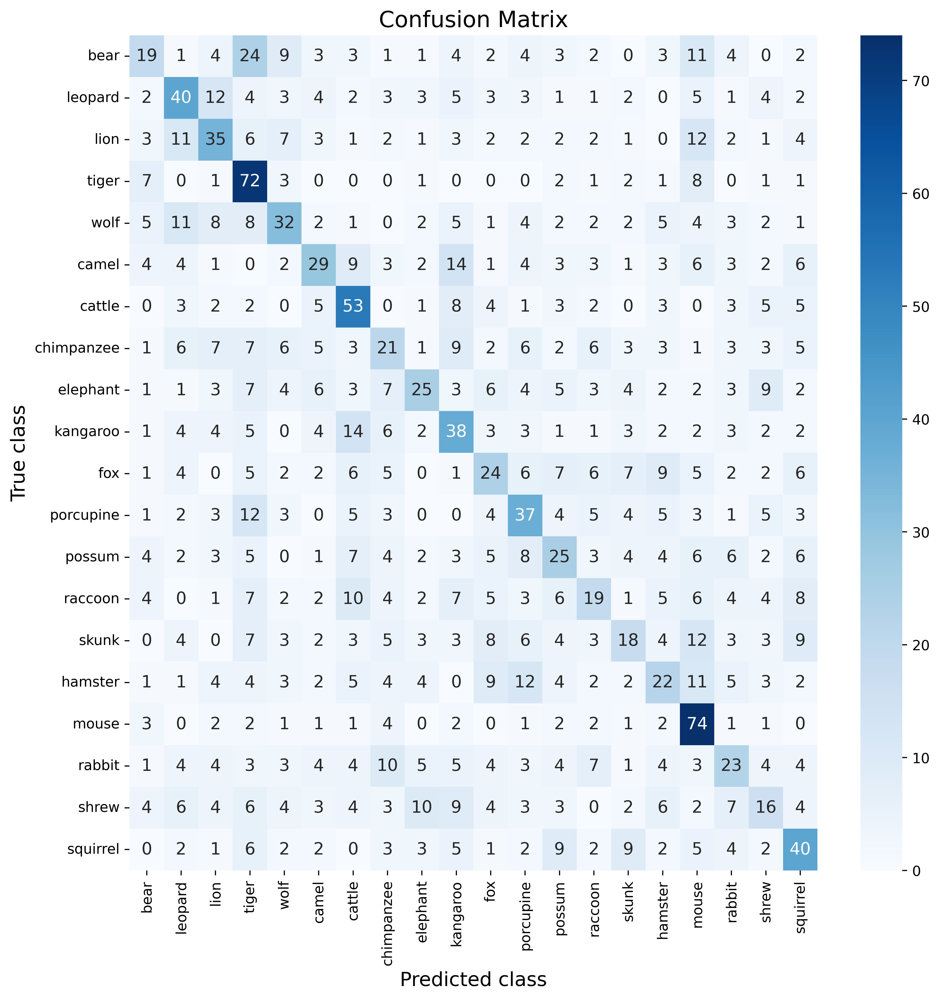

In [ ]:
# TEST: one vs rest
model = load_model("svm_ovr_model")
y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "svm_ovr")

              precision    recall  f1-score   support

        bear       0.29      0.35      0.32       100
     leopard       0.31      0.36      0.33       100
        lion       0.29      0.25      0.27       100
       tiger       0.47      0.64      0.54       100
        wolf       0.35      0.28      0.31       100
       camel       0.36      0.28      0.31       100
      cattle       0.49      0.47      0.48       100
  chimpanzee       0.27      0.28      0.28       100
    elephant       0.32      0.29      0.31       100
    kangaroo       0.39      0.40      0.40       100
         fox       0.32      0.30      0.31       100
   porcupine       0.37      0.38      0.38       100
      possum       0.21      0.24      0.22       100
     raccoon       0.24      0.23      0.23       100
       skunk       0.23      0.22      0.22       100
     hamster       0.26      0.28      0.27       100
       mouse       0.60      0.53      0.56       100
      rabbit       0.26    

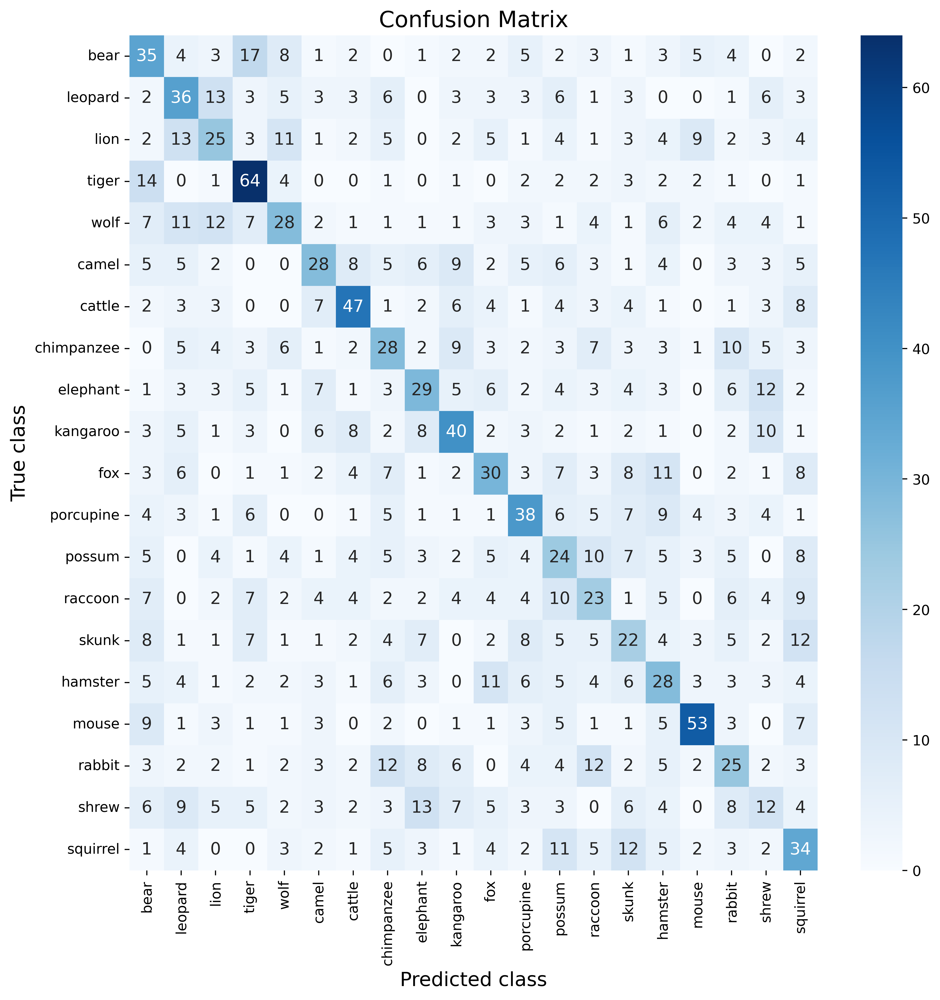

In [ ]:
# TEST: one vs one
model = load_model("svm_ovo_model")
y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "svm_ovo")

In [ ]:
# KNN

In [ ]:
# TRAINING: one vs rest
knn_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', whiten=True, random_state=42),
    OneVsRestClassifier(KNeighborsClassifier())
)

param_grid = {
    'onevsrestclassifier__estimator__n_neighbors': [5, 7, 9, 11],
    'onevsrestclassifier__estimator__weights': ['uniform', 'distance'],
    'onevsrestclassifier__estimator__metric': ['euclidean', 'minkowski']
}

# Trainig model
model = train(knn_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "knn_ovr_model")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestclassifier__estimator__n_neighbors=5, onevsrestclassifier__estimator__weights=uniform; total time=   7.6s
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestclassifier__estimator__n_neighbors=5, onevsrestclassifier__estimator__weights=uniform; total time=   8.9s
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestclassifier__estimator__n_neighbors=5, onevsrestclassifier__estimator__weights=uniform; total time=   7.6s
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestclassifier__estimator__n_neighbors=5, onevsrestclassifier__estimator__weights=uniform; total time=   7.5s
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestclassifier__estimator__n_neighbors=5, onevsrestclassifier__estimator__weights=uniform; total time=   7.6s
[CV] END onevsrestclassifier__estimator__metric=euclidean, onevsrestc

In [ ]:
# TRAINING: one vs one
knn_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', whiten=True, random_state=42),
    OneVsOneClassifier(KNeighborsClassifier())
)

param_grid = {
    'onevsoneclassifier__estimator__n_neighbors': [5, 7, 9, 11],
    'onevsoneclassifier__estimator__weights': ['uniform', 'distance'],
    'onevsoneclassifier__estimator__metric': ['euclidean', 'minkowski']
}

model = train(knn_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "knn_ovo_model")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estimator__n_neighbors=5, onevsoneclassifier__estimator__weights=uniform; total time=   8.3s
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estimator__n_neighbors=5, onevsoneclassifier__estimator__weights=uniform; total time=   8.2s
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estimator__n_neighbors=5, onevsoneclassifier__estimator__weights=uniform; total time=   8.3s
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estimator__n_neighbors=5, onevsoneclassifier__estimator__weights=uniform; total time=   8.2s
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estimator__n_neighbors=5, onevsoneclassifier__estimator__weights=uniform; total time=   8.3s
[CV] END onevsoneclassifier__estimator__metric=euclidean, onevsoneclassifier__estima

              precision    recall  f1-score   support

        bear       0.23      0.03      0.05       100
     leopard       0.42      0.05      0.09       100
        lion       0.09      0.02      0.03       100
       tiger       0.43      0.06      0.11       100
        wolf       0.07      0.36      0.12       100
       camel       0.16      0.08      0.11       100
      cattle       0.65      0.11      0.19       100
  chimpanzee       0.19      0.13      0.15       100
    elephant       0.15      0.09      0.11       100
    kangaroo       0.50      0.07      0.12       100
         fox       0.07      0.23      0.11       100
   porcupine       0.12      0.28      0.17       100
      possum       0.06      0.12      0.08       100
     raccoon       0.10      0.15      0.12       100
       skunk       0.11      0.11      0.11       100
     hamster       0.24      0.09      0.13       100
       mouse       0.26      0.24      0.25       100
      rabbit       0.17    

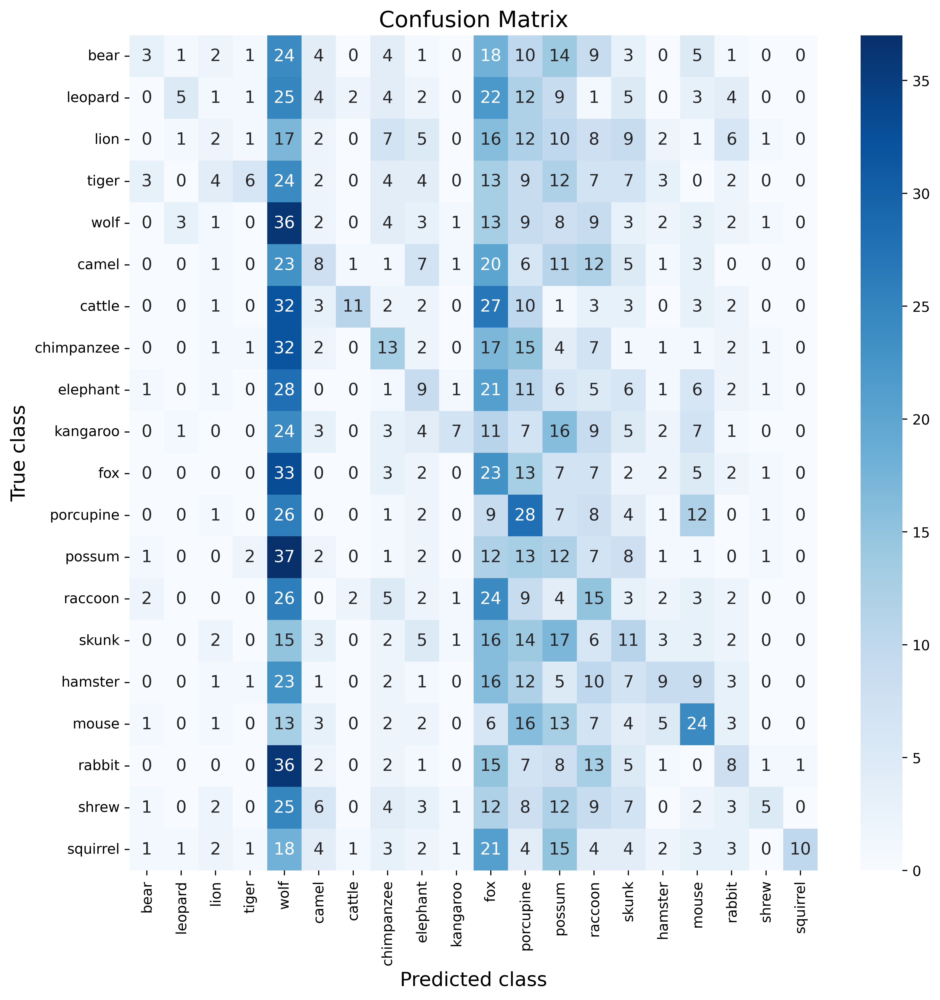

In [ ]:
# TEST: one vs rest
model = load_model("knn_ovr_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "knn_ovr")

              precision    recall  f1-score   support

        bear       0.29      0.02      0.04       100
     leopard       0.33      0.01      0.02       100
        lion       0.29      0.02      0.04       100
       tiger       0.00      0.00      0.00       100
        wolf       0.08      0.36      0.13       100
       camel       0.27      0.06      0.10       100
      cattle       1.00      0.04      0.08       100
  chimpanzee       0.12      0.08      0.09       100
    elephant       0.15      0.06      0.09       100
    kangaroo       0.57      0.04      0.07       100
         fox       0.07      0.30      0.12       100
   porcupine       0.11      0.30      0.16       100
      possum       0.04      0.09      0.06       100
     raccoon       0.10      0.22      0.13       100
       skunk       0.07      0.06      0.06       100
     hamster       0.26      0.05      0.08       100
       mouse       0.19      0.18      0.19       100
      rabbit       0.11    

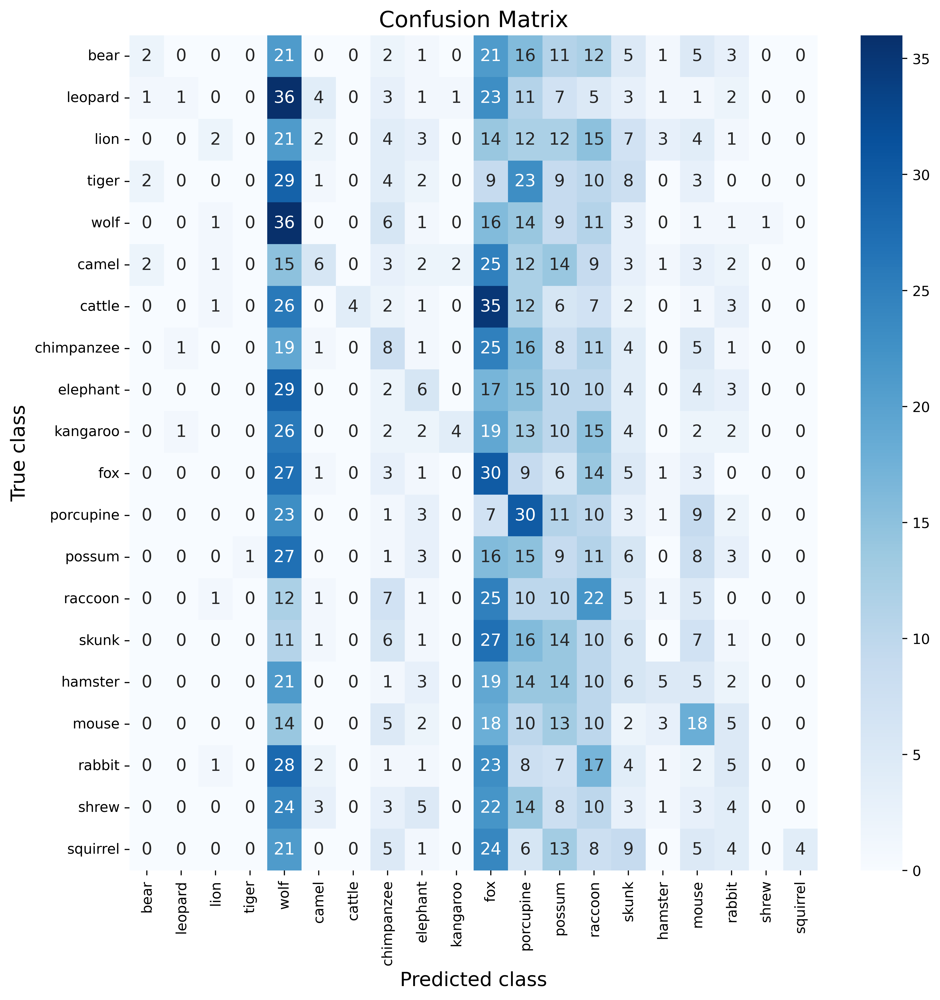

In [ ]:
# TEST: one vs one
model = load_model("knn_ovo_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "knn_ovo")

In [ ]:
# GAUSSIAN NAIVE BAYES

In [ ]:
# TRAINING: one vs rest
gnb_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsRestClassifier(GaussianNB())
)

param_grid = {
    'onevsrestclassifier__estimator__var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7]
}

# Training model
model = train(gnb_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "gnb_ovr_model")

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-11; total time=   6.6s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-11; total time=   6.6s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-11; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-11; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-11; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-10; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-10; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-10; total time=   6.7s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-10; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-10; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoothing=1e-09; total time=   6.5s
[CV] END onevsrestclassifier__estimator__var_smoo

In [ ]:
# TRAINING: one vs one
gnb_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsOneClassifier(GaussianNB())
)

param_grid = {
    'onevsoneclassifier__estimator__var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7]
}

# Training model
model = train(gnb_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "gnb_ovo_model")

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-11; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-11; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-11; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-11; total time=   8.0s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-11; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-10; total time=   8.0s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-10; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-10; total time=   7.8s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-10; total time=   7.9s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-10; total time=   8.0s
[CV] END .onevsoneclassifier__estimator__var_smoothing=1e-09; total time=   8.0s
[CV] END .onevsoneclassifier__estimator__var_smoo

              precision    recall  f1-score   support

        bear       0.18      0.08      0.11       100
     leopard       0.27      0.26      0.27       100
        lion       0.30      0.14      0.19       100
       tiger       0.41      0.34      0.37       100
        wolf       0.27      0.08      0.12       100
       camel       0.32      0.10      0.15       100
      cattle       0.38      0.28      0.32       100
  chimpanzee       0.12      0.07      0.09       100
    elephant       0.19      0.09      0.12       100
    kangaroo       0.38      0.15      0.21       100
         fox       0.28      0.08      0.12       100
   porcupine       0.11      0.61      0.18       100
      possum       0.15      0.07      0.10       100
     raccoon       0.13      0.13      0.13       100
       skunk       0.23      0.13      0.17       100
     hamster       0.11      0.07      0.09       100
       mouse       0.18      0.54      0.27       100
      rabbit       0.12    

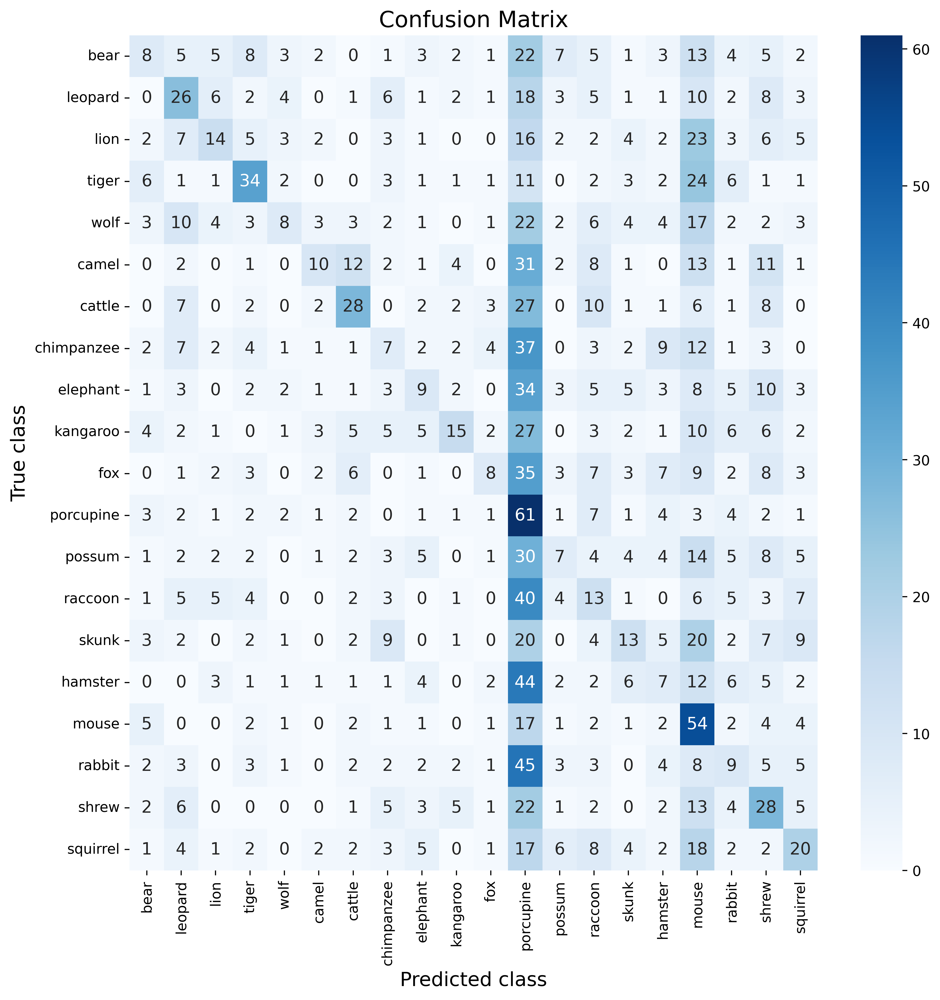

In [ ]:
# TESTING: one vs rest
model = load_model("gnb_ovr_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "gnb_ovr")

              precision    recall  f1-score   support

        bear       0.16      0.08      0.11       100
     leopard       0.27      0.26      0.26       100
        lion       0.28      0.14      0.19       100
       tiger       0.41      0.33      0.36       100
        wolf       0.28      0.08      0.12       100
       camel       0.30      0.10      0.15       100
      cattle       0.39      0.28      0.33       100
  chimpanzee       0.11      0.07      0.09       100
    elephant       0.20      0.10      0.13       100
    kangaroo       0.37      0.15      0.21       100
         fox       0.27      0.08      0.12       100
   porcupine       0.11      0.60      0.18       100
      possum       0.14      0.07      0.09       100
     raccoon       0.13      0.13      0.13       100
       skunk       0.22      0.13      0.16       100
     hamster       0.12      0.08      0.10       100
       mouse       0.19      0.53      0.27       100
      rabbit       0.12    

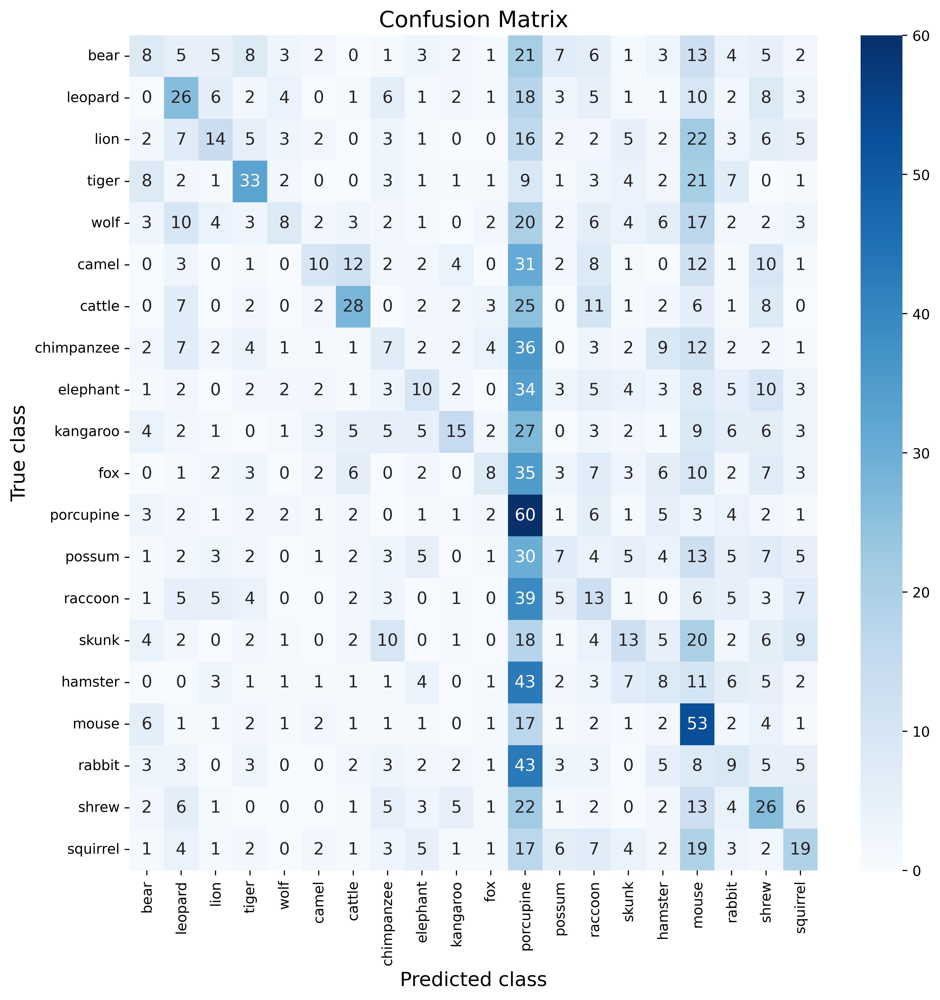

In [ ]:
# TESTING: one vs one
model = load_model("gnb_ovo_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "gnb_ovo")

In [ ]:
# RANDOM FOREST

In [ ]:
# TRAINING: one vs rest
rf_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsRestClassifier(RandomForestClassifier(random_state=42))
)

param_grid = {
    'onevsrestclassifier__estimator__n_estimators': [10, 50, 100],
    'onevsrestclassifier__estimator__max_features': ['sqrt', 'log2'],
    'onevsrestclassifier__estimator__min_samples_leaf': [1, 2, 4]
}

# Training model
model = train(rf_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "rf_ovr_model")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END onevsrestclassifier__estimator__max_features=sqrt, onevsrestclassifier__estimator__min_samples_leaf=1, onevsrestclassifier__estimator__n_estimators=10; total time=  32.7s
[CV] END onevsrestclassifier__estimator__max_features=sqrt, onevsrestclassifier__estimator__min_samples_leaf=1, onevsrestclassifier__estimator__n_estimators=10; total time=  32.1s
[CV] END onevsrestclassifier__estimator__max_features=sqrt, onevsrestclassifier__estimator__min_samples_leaf=1, onevsrestclassifier__estimator__n_estimators=10; total time=   0.0s
[CV] END onevsrestclassifier__estimator__max_features=sqrt, onevsrestclassifier__estimator__min_samples_leaf=1, onevsrestclassifier__estimator__n_estimators=10; total time=  30.8s
[CV] END onevsrestclassifier__estimator__max_features=sqrt, onevsrestclassifier__estimator__min_samples_leaf=1, onevsrestclassifier__estimator__n_estimators=10; total time=  31.4s
[CV] END onevsrestclassifier__estimator

In [ ]:
# TRAINING: one vs one
rf_pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.95, svd_solver='full', random_state=42),
    OneVsOneClassifier(RandomForestClassifier(random_state=42))
)

param_grid = {
    'onevsoneclassifier__estimator__n_estimators': [10, 50, 100],
    'onevsoneclassifier__estimator__max_features': ['sqrt', 'log2'],
    'onevsoneclassifier__estimator__min_samples_leaf': [1, 2, 4]
}

# Training model
model = train(rf_pipeline, param_grid, X_train_flat, y_train)
save_model(model, "rf_ovo_model")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END onevsoneclassifier__estimator__max_features=sqrt, onevsoneclassifier__estimator__min_samples_leaf=1, onevsoneclassifier__estimator__n_estimators=10; total time=  16.8s
[CV] END onevsoneclassifier__estimator__max_features=sqrt, onevsoneclassifier__estimator__min_samples_leaf=1, onevsoneclassifier__estimator__n_estimators=10; total time=  16.8s
[CV] END onevsoneclassifier__estimator__max_features=sqrt, onevsoneclassifier__estimator__min_samples_leaf=1, onevsoneclassifier__estimator__n_estimators=10; total time=  16.7s
[CV] END onevsoneclassifier__estimator__max_features=sqrt, onevsoneclassifier__estimator__min_samples_leaf=1, onevsoneclassifier__estimator__n_estimators=10; total time=  16.6s
[CV] END onevsoneclassifier__estimator__max_features=sqrt, onevsoneclassifier__estimator__min_samples_leaf=1, onevsoneclassifier__estimator__n_estimators=10; total time=  16.9s
[CV] END onevsoneclassifier__estimator__max_features=s

              precision    recall  f1-score   support

        bear       0.22      0.17      0.19       100
     leopard       0.27      0.25      0.26       100
        lion       0.29      0.16      0.21       100
       tiger       0.33      0.55      0.41       100
        wolf       0.20      0.14      0.17       100
       camel       0.28      0.22      0.25       100
      cattle       0.29      0.43      0.35       100
  chimpanzee       0.20      0.23      0.21       100
    elephant       0.24      0.22      0.23       100
    kangaroo       0.27      0.38      0.32       100
         fox       0.17      0.15      0.16       100
   porcupine       0.23      0.28      0.25       100
      possum       0.15      0.14      0.14       100
     raccoon       0.22      0.17      0.19       100
       skunk       0.14      0.09      0.11       100
     hamster       0.23      0.26      0.24       100
       mouse       0.36      0.45      0.40       100
      rabbit       0.08    

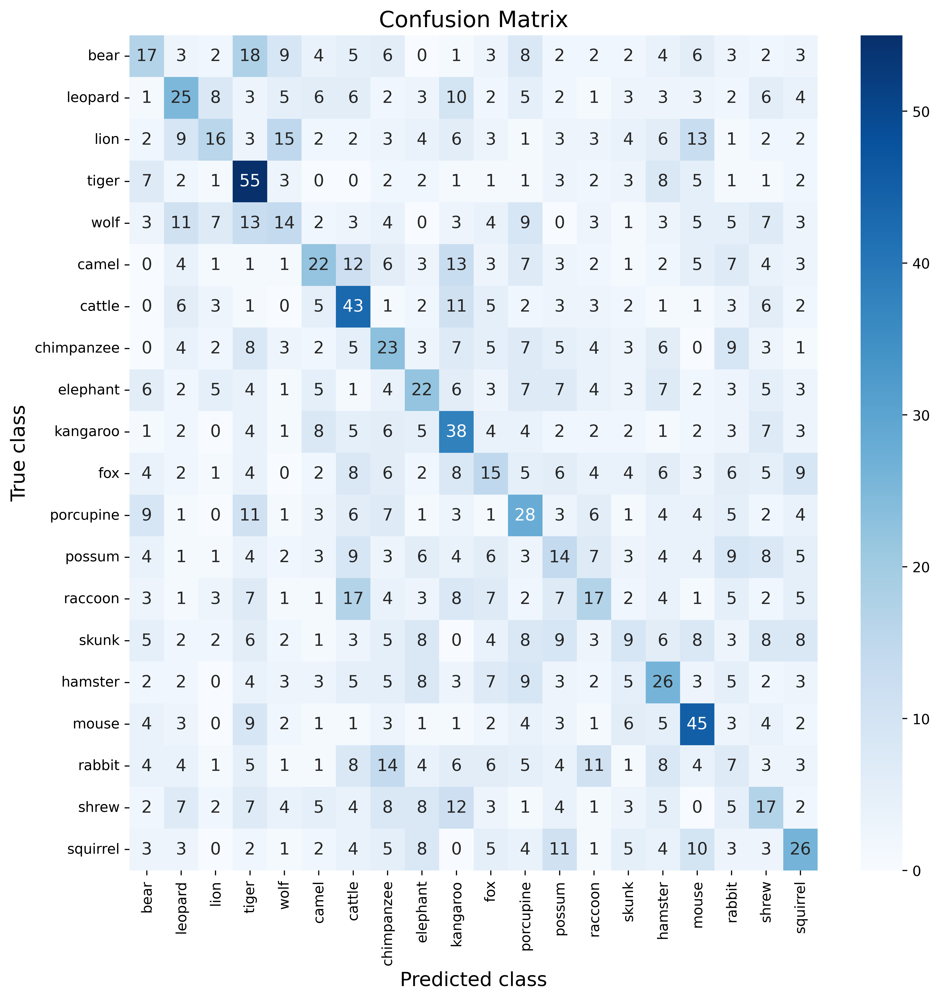

In [ ]:
# TEST: one vs rest
model = load_model("rf_ovr_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "rf_ovr")

              precision    recall  f1-score   support

        bear       0.26      0.21      0.23       100
     leopard       0.28      0.37      0.32       100
        lion       0.32      0.25      0.28       100
       tiger       0.38      0.54      0.45       100
        wolf       0.26      0.23      0.24       100
       camel       0.32      0.20      0.25       100
      cattle       0.45      0.42      0.44       100
  chimpanzee       0.22      0.14      0.17       100
    elephant       0.30      0.17      0.22       100
    kangaroo       0.32      0.44      0.37       100
         fox       0.26      0.17      0.21       100
   porcupine       0.33      0.29      0.31       100
      possum       0.15      0.09      0.11       100
     raccoon       0.26      0.20      0.23       100
       skunk       0.23      0.22      0.23       100
     hamster       0.30      0.32      0.31       100
       mouse       0.36      0.51      0.42       100
      rabbit       0.13    

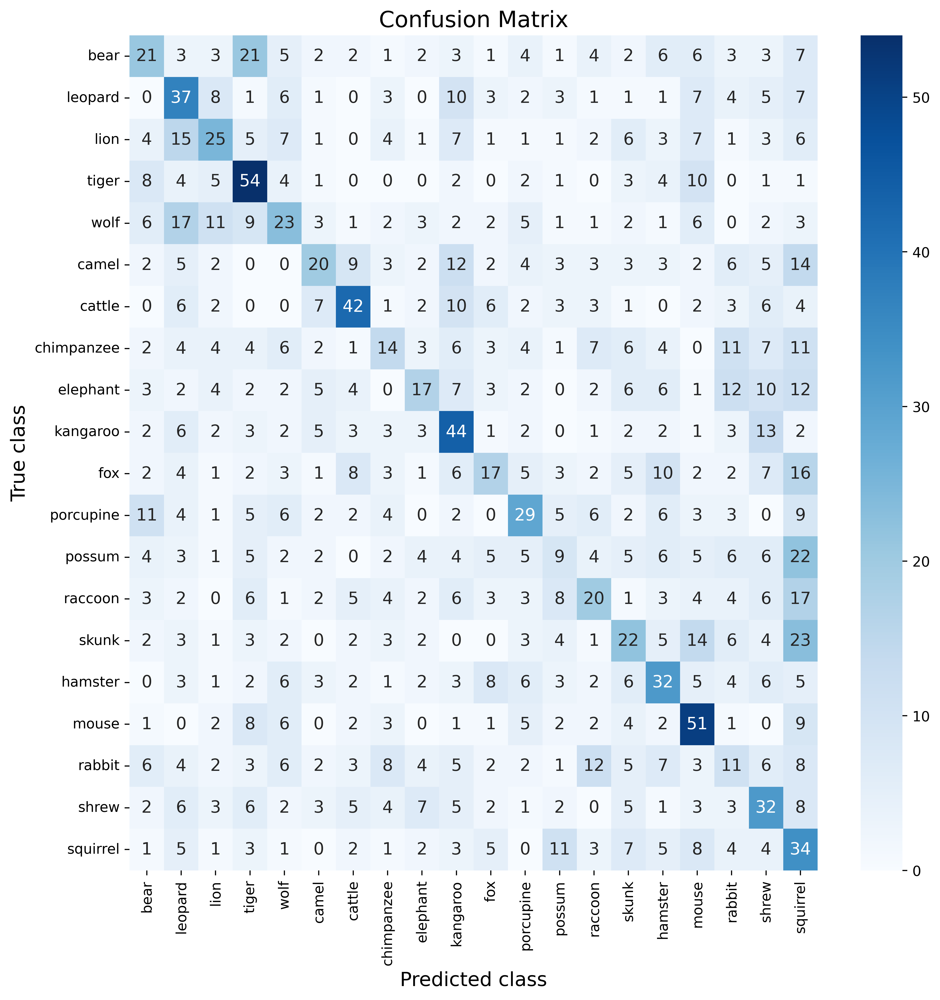

In [ ]:
# TEST: one vs one
model = load_model("rf_ovo_model")

y_pred = model.predict(X_test_flat)

print(classification_report(y_test, y_pred, target_names=animal_classes))

show_confusion_matrix(model, X_test_flat, y_test, "rf_ovo")

In [ ]:
# COMPARISON

> Model: Logistic Regression (OvR)
	> Best parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'saga'}
	> Best training score: 21.28%

Model: Logistic Regression (OvR) | Test Accuracy: 21.75% | Test F1 score: 21.01% | Precision: 20.91% | Recall: 21.75%
> Model: Logistic Regression (OvO)
	> Best parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'sag'}
	> Best training score: 20.45%

Model: Logistic Regression (OvO) | Test Accuracy: 21.15% | Test F1 score: 20.57% | Precision: 20.38% | Recall: 21.15%
> Model: Support Vector Machine (OvR)
	> Best parameters: {'C': 1, 'gamma': 'scale'}
	> Best training score: 31.32%

Model: Support Vector Machine (OvR) | Test Accuracy: 33.10% | Test F1 score: 31.66% | Precision: 31.96% | Recall: 33.10%
> Model: Support Vector Machine (OvO)
	> Best parameters: {'C': 10, 'gamma': 'scale'}
	> Best training score: 29.90%

Model: Support Vector Machine (OvO) | Test Accuracy: 32.45% | Test F1 score: 32.22% | Precision: 32.36% | Recall: 32.45%
> Model: K-Nearest Nei

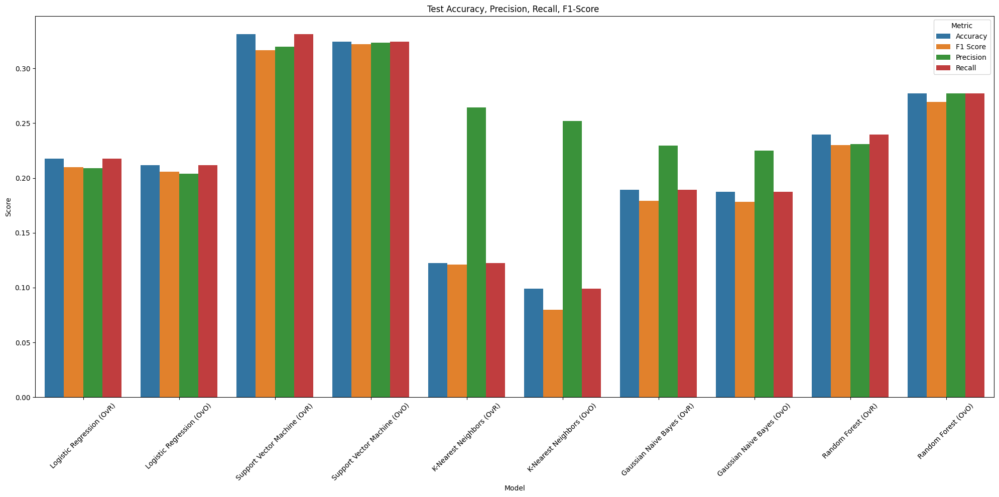

In [ ]:
lr_ovr_model = load_model("lr_ovr_model")
lr_ovo_model = load_model("lr_ovo_model")
svm_ovr_model = load_model("svm_ovr_model")
svm_ovo_model = load_model("svm_ovo_model")
knn_ovr_model = load_model("knn_ovr_model")
knn_ovo_model = load_model("knn_ovo_model")
gnb_ovr_model = load_model("gnb_ovr_model")
gnb_ovo_model = load_model("gnb_ovo_model")
rf_ovr_model = load_model("rf_ovr_model")
rf_ovo_model = load_model("rf_ovo_model")

comparison = create_comparison(
    [
        lr_ovr_model,
        lr_ovo_model,
        svm_ovr_model,
        svm_ovo_model,
        knn_ovr_model,
        knn_ovo_model,
        gnb_ovr_model,
        gnb_ovo_model,
        rf_ovr_model,
        rf_ovo_model
    ],
     [
        "Logistic Regression (OvR)",
        "Logistic Regression (OvO)",
        "Support Vector Machine (OvR)",
        "Support Vector Machine (OvO)",
        "K-Nearest Neighbors (OvR)",
        "K-Nearest Neighbors (OvO)",
        "Gaussian Naive Bayes (OvR)",
        "Gaussian Naive Bayes (OvO)",
        "Random Forest (OvR)",
        "Random Forest (OvO)"
    ],
    X_test_flat,
    y_test
)

df_ovr = comparison[comparison["Model"].str.contains("OvR")].pivot(
    index="Model", columns="Metric", values="Score")
df_ovo = comparison[comparison["Model"].str.contains("OvO")].pivot(
    index="Model", columns="Metric", values="Score")